# CMAPSS Jet Engine Simulated Data
Aerospace

Data sets consists of multiple multivariate time series. Each data set is further divided into training and test subsets. Each time series is from a different engine i.e., the data can be considered to be from a fleet of engines of the same type. Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.

The data are provided as a zip-compressed text file with 26 columns of numbers, separated by spaces. Each row is a snapshot of data taken during a single operational cycle, each column is a different variable. 

The columns correspond to:
1) unit number
2) time, in cycles
3) operational setting 1
4) operational setting 2
5) operational setting 3
6) sensor measurement 1
7) sensor measurement 2
...
26) sensor measurement 26

Data Set: FD001
* Train trjectories: 100
* Test trajectories: 100
* Conditions: ONE (Sea Level)
* Fault Modes: ONE (HPC Degradation)

Data Set: FD002
* Train trjectories: 260
* Test trajectories: 259
* Conditions: SIX
* Fault Modes: ONE (HPC Degradation)

Data Set: FD003
* Train trjectories: 100
* Test trajectories: 100
* Conditions: ONE (Sea Level)
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

Data Set: FD004
* Train trjectories: 248
* Test trajectories: 249
* Conditions: SIX
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

Reference: A. Saxena, K. Goebel, D. Simon, and N. Eklund, ‘Damage Propagation Modeling for Aircraft Engine Run-to-Failure Simulation’, in the Proceedings of the 1st International Conference on Prognostics and Health Management (PHM08), Denver CO, Oct 2008.

https://data.nasa.gov/Aerospace/CMAPSS-Jet-Engine-Simulated-Data/ff5v-kuh6

Updated
July 15, 2022

#### Import libraries

In [27]:
import os
import pandas as pd
import matplotlib.pyplot as plt

from pymongo import MongoClient
from pymongo.errors import OperationFailure
import pandas as pd
import seaborn as sns

import sweetviz as sv

%matplotlib inline

# import sqlalchemy as sa

Establish connection to the DB

In [28]:
def check_mongo_connection(client_uri):
    connection = MongoClient(client_uri)

    try:
        connection.database_names
        print('\n')
        print(f'Data Base Connection to {client_uri} Established........')
        print('DBs available:')
        for db_name in connection.list_databases():
            print(' DB Name:', db_name['name'])
            db = connection[db_name['name']]
            collections =[]
            for collection_name in db.list_collection_names():
                collections.append(collection_name)
            print('   Colections:', collections)
          
        
    except OperationFailure as err:
        print(f"Data Base Connection failed. Error: {err}")

    return connection

client_uri = "mongodb://192.168.1.20:27017"
server = check_mongo_connection(client_uri)
db_set1 = 'TurboFanDegradation_Set1'
db_set2 = 'TurboFanDegradation_Set2'



Data Base Connection to mongodb://192.168.1.20:27017 Established........
DBs available:
 DB Name: TurboFanDegradation_Set1
   Colections: ['test_FD001', 'test_FD004', 'train_FD003', 'test_FD002', 'test_FD003', 'train_FD004', 'train_FD002', 'train_FD001']
 DB Name: admin
   Colections: ['system.version']
 DB Name: config
   Colections: ['system.sessions']
 DB Name: local
   Colections: ['startup_log']


#### Load data from DB

In [29]:
# Load 4 training collections (data files) from MongoDB
train_data1 = pd.DataFrame(list(server[db_set1]['train_FD001'].find()))
train_data2 = pd.DataFrame(list(server[db_set1]['train_FD002'].find()))
train_data3 = pd.DataFrame(list(server[db_set1]['train_FD003'].find()))
train_data4 = pd.DataFrame(list(server[db_set1]['train_FD004'].find()))
train_data1.drop('_id', axis=1, inplace=True)
train_data2.drop('_id', axis=1, inplace=True)
train_data3.drop('_id', axis=1, inplace=True)
train_data4.drop('_id', axis=1, inplace=True)



# Exploration Data Analysis 
### For the simulated equipment degradation data

Find columns with no values

In [30]:
def missing_data(df):
    missing_data = df.isna().sum()
    columns = missing_data[missing_data > 0]
    if len(columns) == 0:
        columns = 0
    return columns

# missing_data(train_data2)
print(f'Columns with missing data in train_data1: {missing_data(train_data1)}')
print(f'Columns with missing data in train_data2: {missing_data(train_data2)}')
print(f'Columns with missing data in train_data3: {missing_data(train_data3)}')
print(f'Columns with missing data in train_data4: {missing_data(train_data4)}')


Columns with missing data in train_data1: 0
Columns with missing data in train_data2: 0
Columns with missing data in train_data3: 0
Columns with missing data in train_data4: 0


Confirm number of records for each file

In [31]:
print(f'Total records in train_data1: {train_data1.shape[0]}, columns: {train_data1.shape[1]}')
print(f'Total records in train_data2: {train_data2.shape[0]}, columns: {train_data2.shape[1]}')
print(f'Total records in train_data3: {train_data3.shape[0]}, columns: {train_data3.shape[1]}')
print(f'Total records in train_data4: {train_data4.shape[0]}, columns: {train_data4.shape[1]}')

Total records in train_data1: 41260, columns: 26
Total records in train_data2: 107516, columns: 26
Total records in train_data3: 24719, columns: 26
Total records in train_data4: 61248, columns: 26


Number of unique/individual Turbines per file

Individual units in train_data1: 100
Individual units in train_data2: 260
Individual units in train_data3: 100
Individual units in train_data4: 249


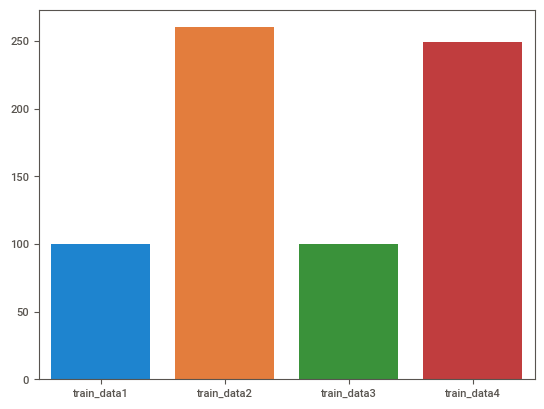

In [32]:
file_name = ['train_data1', 'train_data2', 'train_data3', 'train_data4']
turbines = [len(train_data1['unit #'].unique()), len(train_data2['unit #'].unique()), len(train_data3['unit #'].unique()), len(train_data4['unit #'].unique())]

sns.barplot(x=file_name, y=turbines);

print('Individual units in train_data1:', len(train_data1['unit #'].unique()))
print('Individual units in train_data2:', len(train_data2['unit #'].unique()))
print('Individual units in train_data3:', len(train_data3['unit #'].unique()))
print('Individual units in train_data4:', len(train_data4['unit #'].unique()))

In [33]:
print(f'Total records in train_data1: {train_data1.shape[0]}, columns: {train_data1.shape[1]}')
print(f'Total records in train_data2: {train_data2.shape[0]}, columns: {train_data2.shape[1]}')
print(f'Total records in train_data3: {train_data3.shape[0]}, columns: {train_data3.shape[1]}')
print(f'Total records in train_data4: {train_data4.shape[0]}, columns: {train_data4.shape[1]}')

Total records in train_data1: 41260, columns: 26
Total records in train_data2: 107516, columns: 26
Total records in train_data3: 24719, columns: 26
Total records in train_data4: 61248, columns: 26


Cycles by Unit Number

In [34]:
max_cycles_data1 = train_data1.groupby(['unit #'])['time (cycles)'].max()
max_cycles_data2 = train_data2.groupby(['unit #'])['time (cycles)'].max()
max_cycles_data3 = train_data3.groupby(['unit #'])['time (cycles)'].max()
max_cycles_data4 = train_data4.groupby(['unit #'])['time (cycles)'].max()

* Only some units have the same number of maximum cycles before failing.

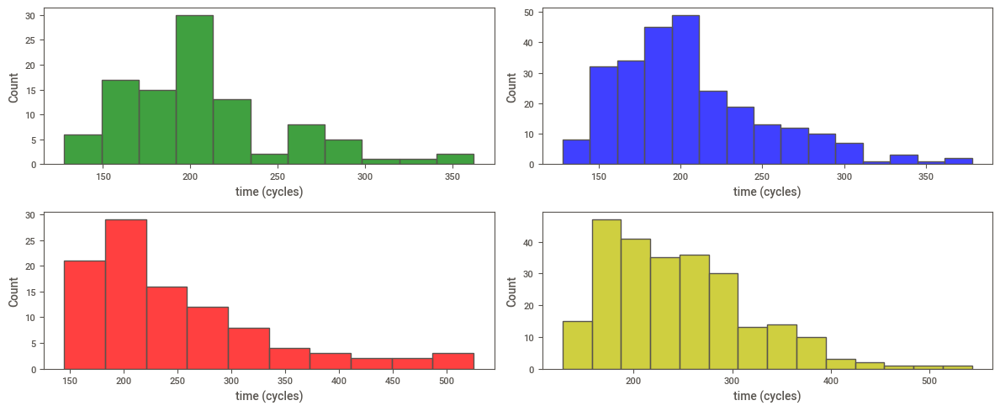

In [35]:
# histogram
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 5))
sns.histplot(max_cycles_data1, color = 'g', ax=ax[0, 0]);
sns.histplot(max_cycles_data2, color = 'b', ax=ax[0, 1]);
sns.histplot(max_cycles_data3, color = 'r', ax=ax[1, 0]);
sns.histplot(max_cycles_data4, color = 'y', ax=ax[1, 1]);
plt.tight_layout();


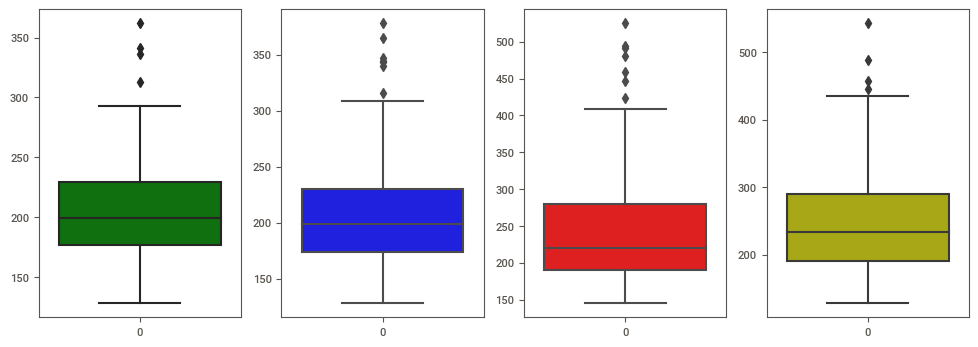

In [36]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(12, 4))
sns.boxplot([max_cycles_data1], color = 'g', ax=ax[0]);
sns.boxplot([max_cycles_data2], color = 'b', ax=ax[1]);
sns.boxplot([max_cycles_data3], color = 'r', ax=ax[2]);
sns.boxplot([max_cycles_data4], color = 'y', ax=ax[3]);


#### Operating Setting 1
* Negative numbers for files 1 and 2
* Higher values for files 3 and 4

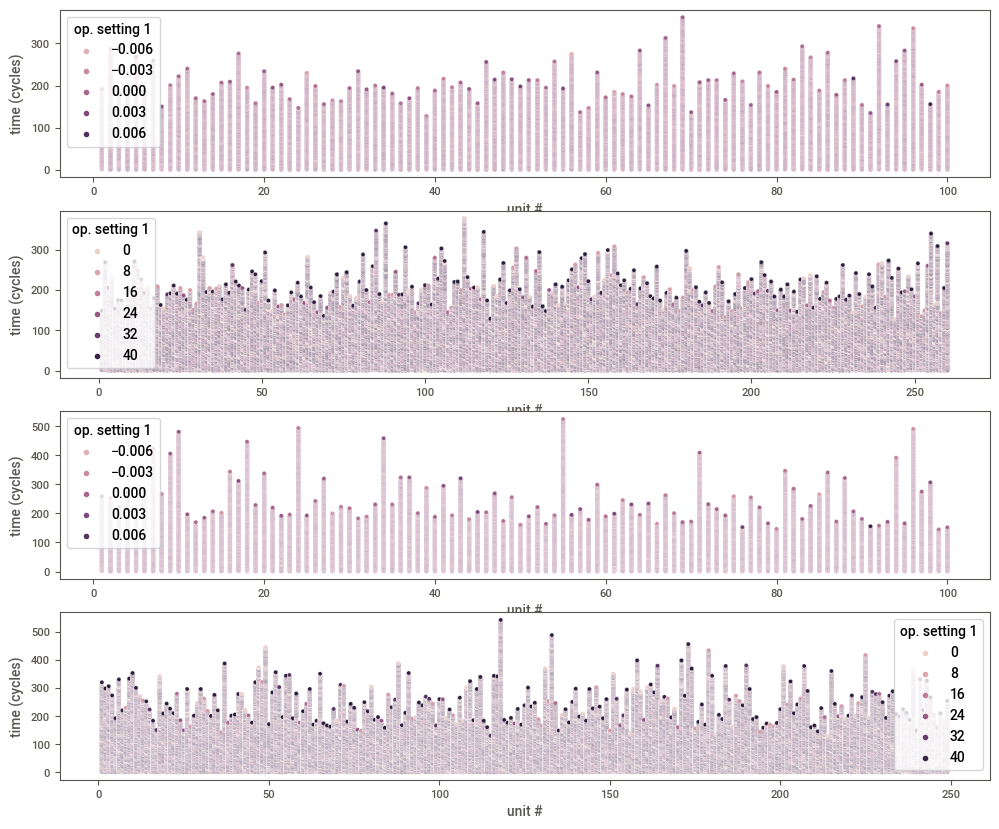

In [37]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(12, 10))
sns.scatterplot(data=train_data1, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 1', ax=ax[0]);
sns.scatterplot(data=train_data2, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 1', ax=ax[1]);
sns.scatterplot(data=train_data3, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 1', ax=ax[2]);
sns.scatterplot(data=train_data4, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 1', ax=ax[3]);


#### Operating Setting 2
* Negative numbers for files 1 and 2
* Higher values for files 3 and 4

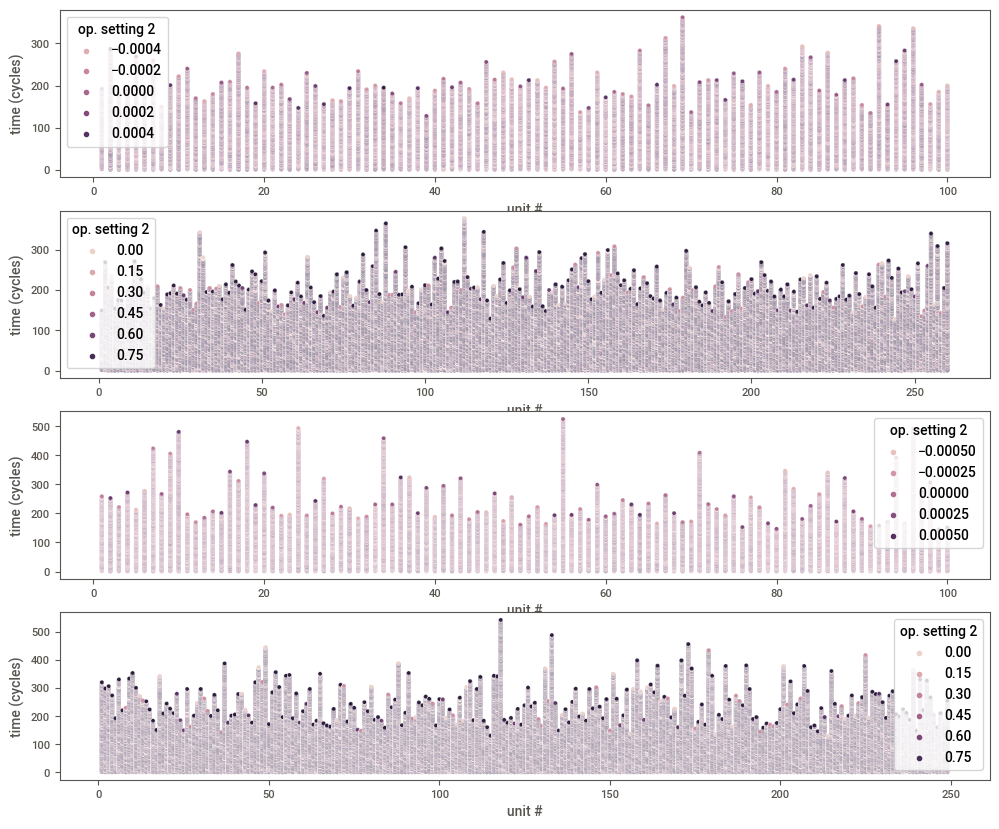

In [38]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(12, 10))
sns.scatterplot(data=train_data1, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 2', ax=ax[0]);
sns.scatterplot(data=train_data2, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 2', ax=ax[1]);
sns.scatterplot(data=train_data3, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 2', ax=ax[2]);
sns.scatterplot(data=train_data4, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 2', ax=ax[3]);

#### Operating Setting 3
* One value (100) for files 1 and 2
* Two values (60, 100) for files 3 and 4

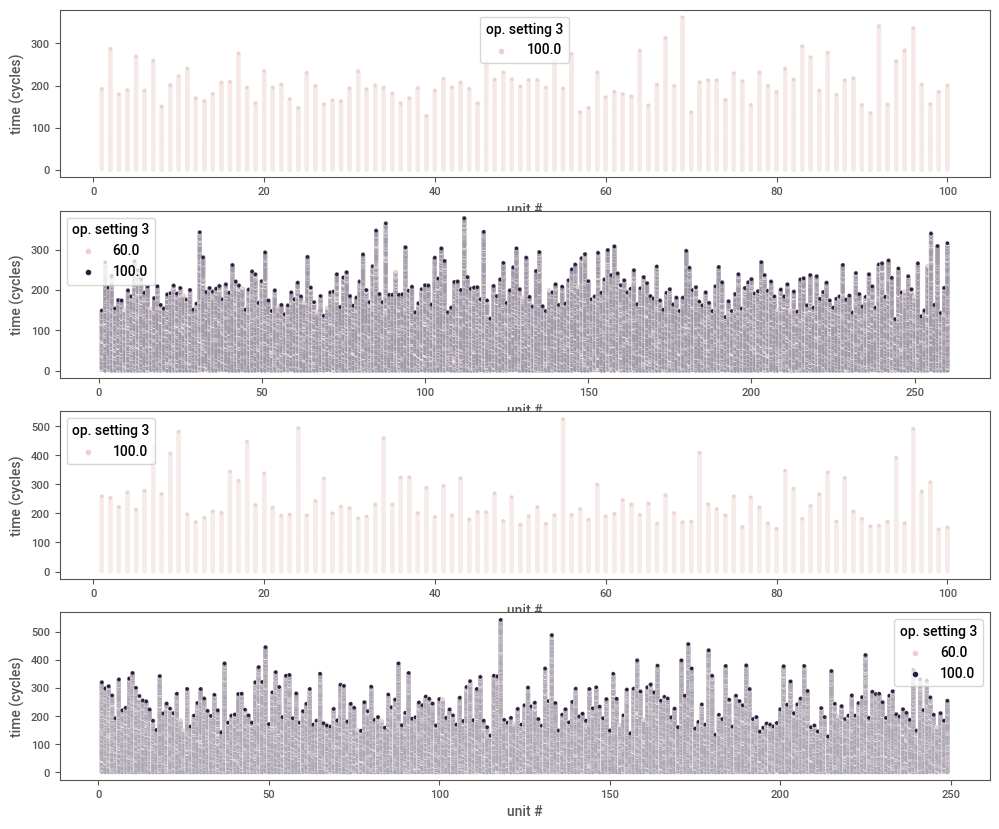

In [39]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(12, 10))
sns.scatterplot(data=train_data1, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 3', ax=ax[0]);
sns.scatterplot(data=train_data2, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 3', ax=ax[1]);
sns.scatterplot(data=train_data3, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 3', ax=ax[2]);
sns.scatterplot(data=train_data4, x = 'unit #', y = 'time (cycles)', hue = 'op. setting 3', ax=ax[3]);

#### 21 Sensors
* Representing the behavior by a sensor for the first ten units on each file
* Behavior on files 2 and 4 have a similar pattern
* Behavior on files 1 and 3 show different patterns for sensors 6, 7, 10, 12, 15, 20, and 21

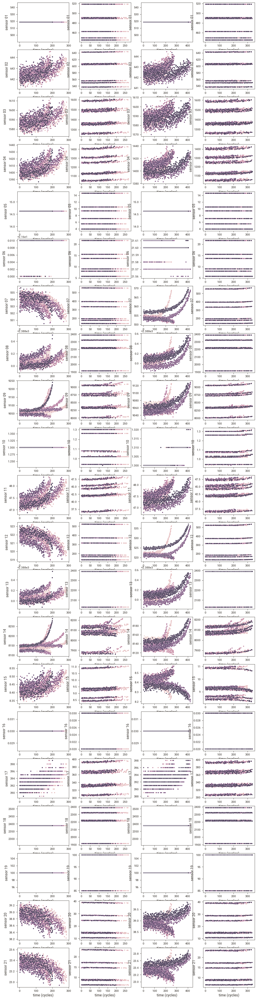

In [40]:
sensors = [
    'sensor 01', 'sensor 02', 'sensor 03', 'sensor 04', 'sensor 05', 'sensor 06', 'sensor 07',
    'sensor 08', 'sensor 09', 'sensor 10', 'sensor 11', 'sensor 12', 'sensor 13', 'sensor 14',
    'sensor 15', 'sensor 16', 'sensor 17', 'sensor 18', 'sensor 19', 'sensor 20', 'sensor 21',
]
fig, ax = plt.subplots(nrows=21, ncols=4, figsize=(12, 50))
for i in range(len(sensors)):
    sns.scatterplot(data=train_data1[train_data1['unit #'] < 10], hue = 'unit #', x = 'time (cycles)', y = sensors[i], ax=ax[i, 0], legend=False);
    sns.scatterplot(data=train_data2[train_data2['unit #'] < 10], hue = 'unit #', x = 'time (cycles)', y = sensors[i], ax=ax[i, 1], legend=False);
    sns.scatterplot(data=train_data3[train_data3['unit #'] < 10], hue = 'unit #', x = 'time (cycles)', y = sensors[i], ax=ax[i, 2], legend=False);
    sns.scatterplot(data=train_data4[train_data4['unit #'] < 10], hue = 'unit #', x = 'time (cycles)', y = sensors[i], ax=ax[i, 3], legend=False);

### Automating EDA for the 4 files

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated


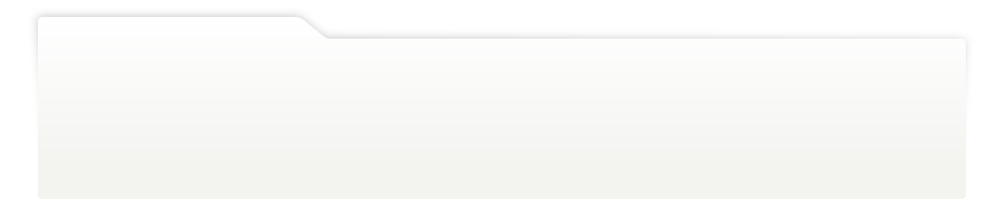
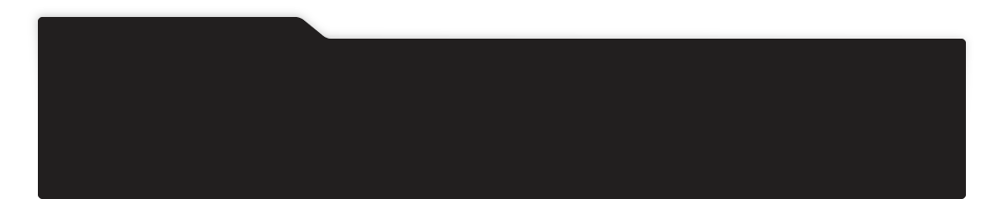
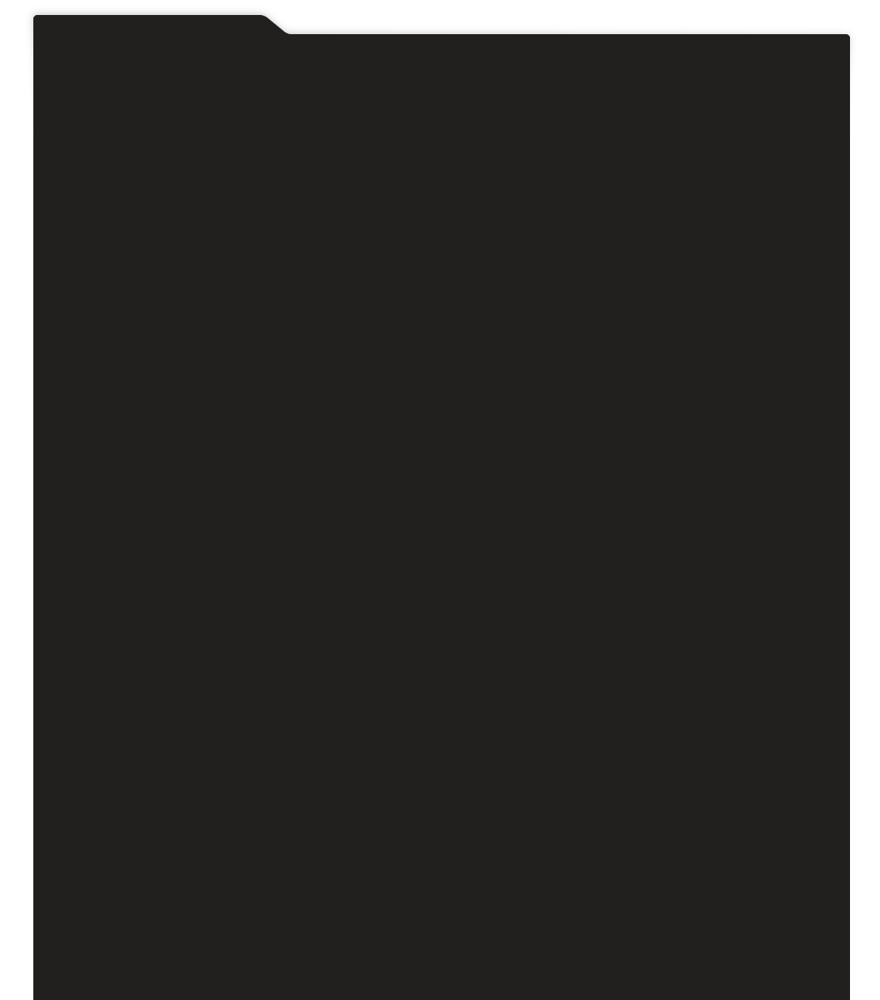
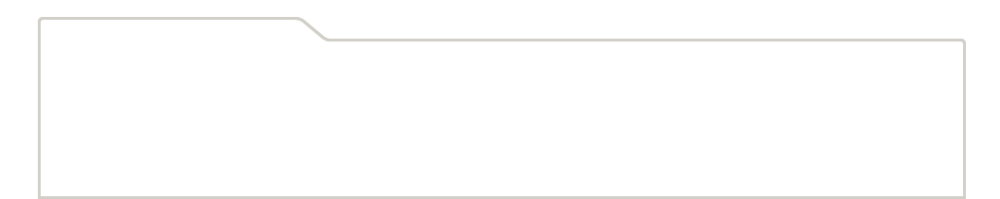
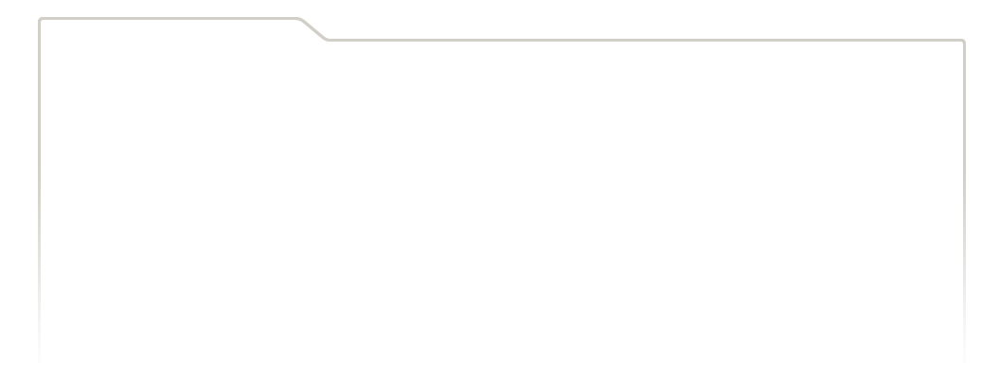
...
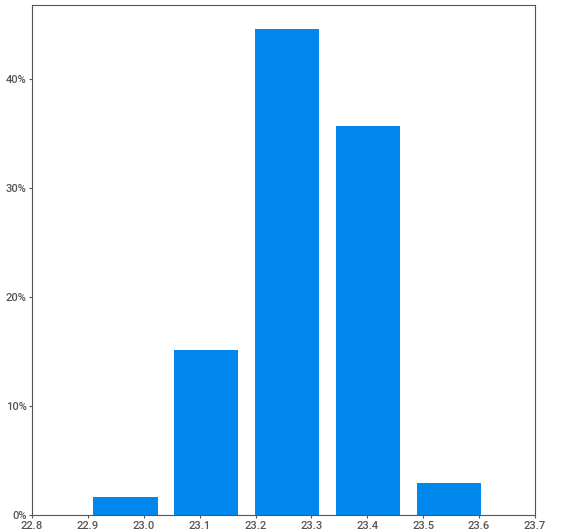
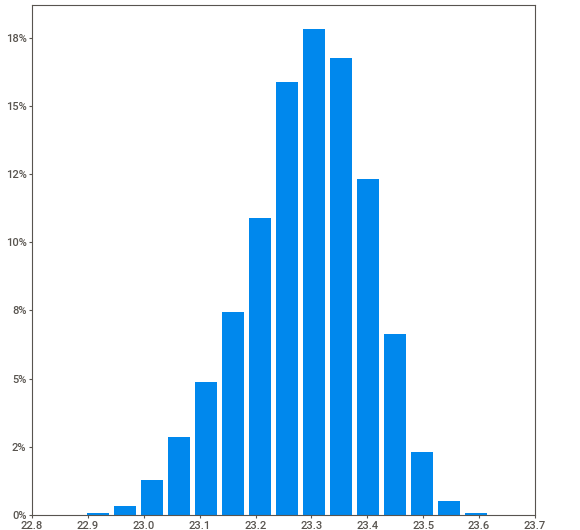
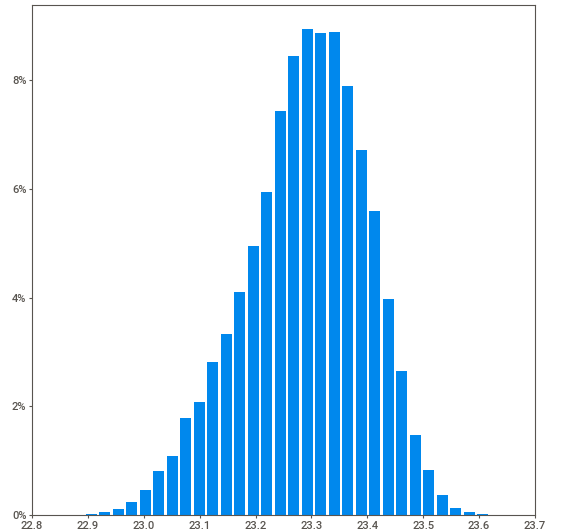
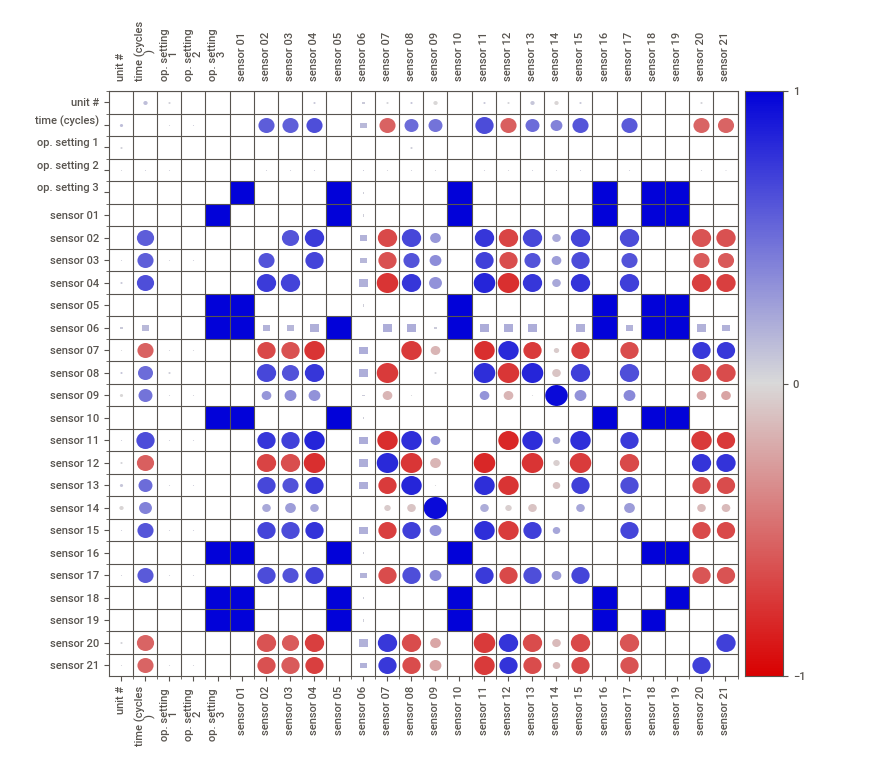
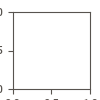

Report orig_data_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [41]:
orig_data_report = sv.analyze(train_data1)
orig_data_report.show_notebook()
orig_data_report.show_html('orig_data_report.html', open_browser=True)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated


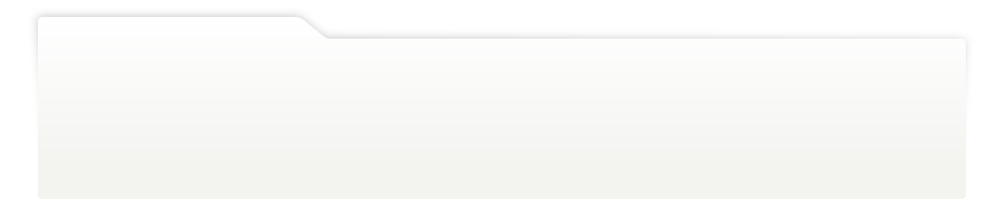
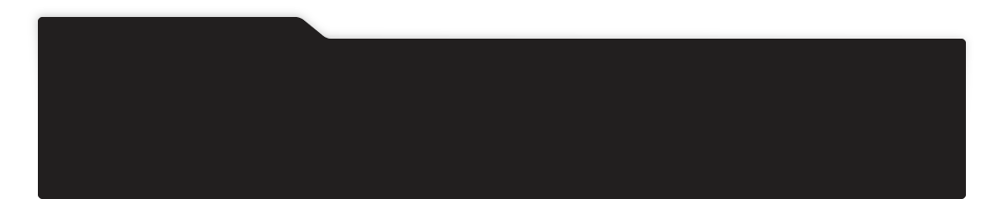
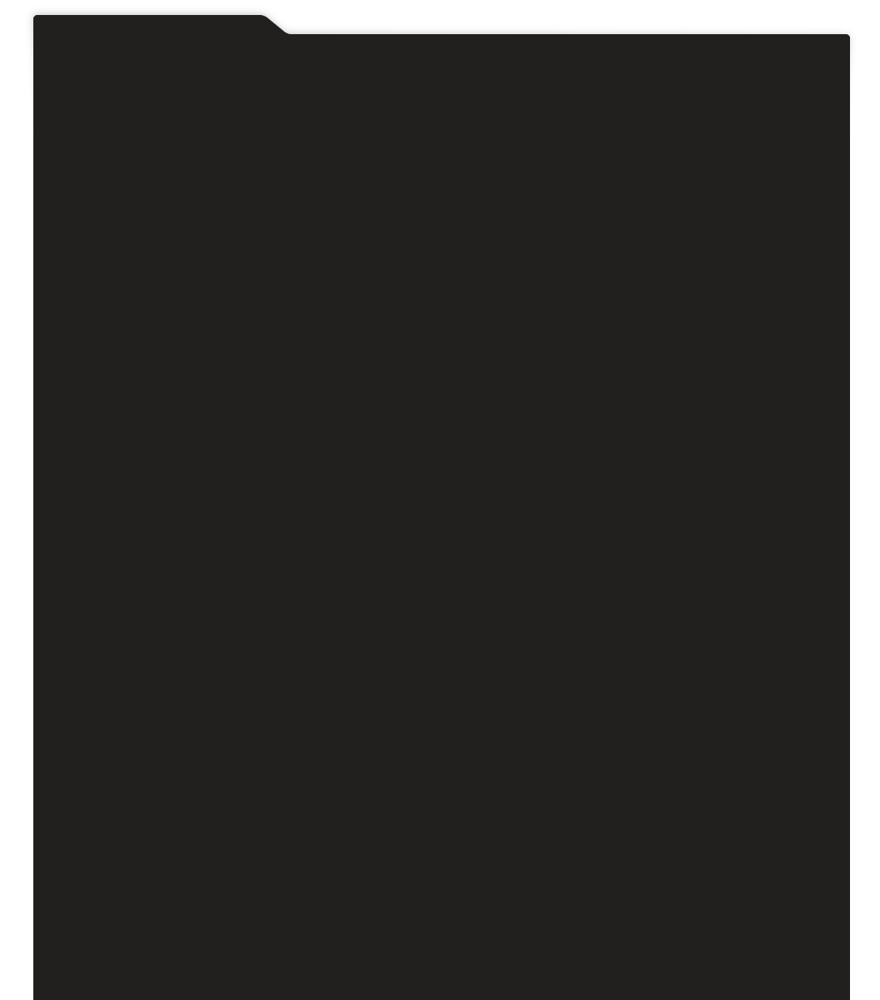
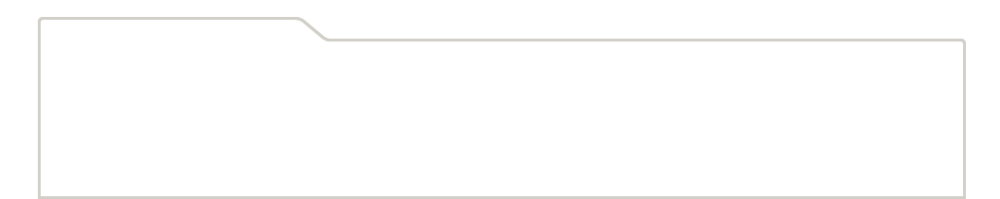
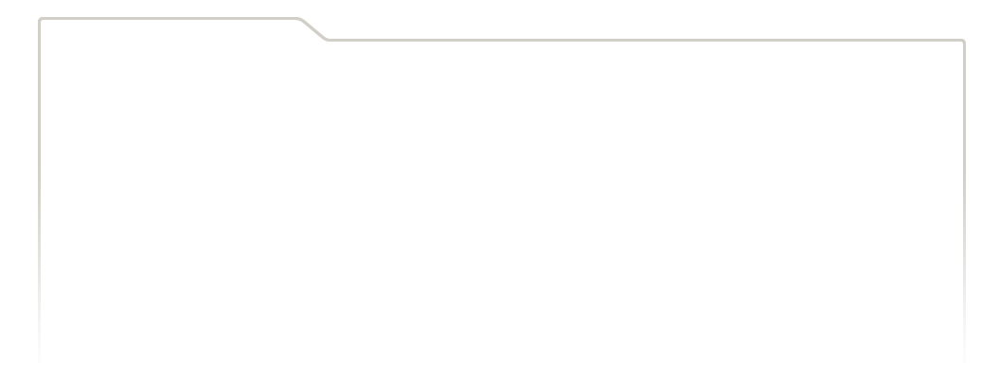
...
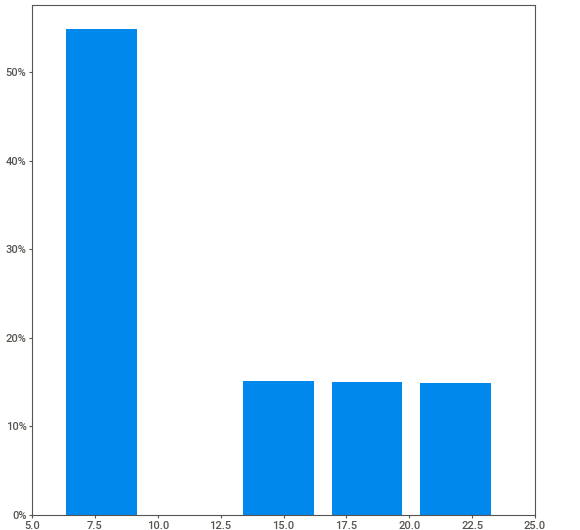
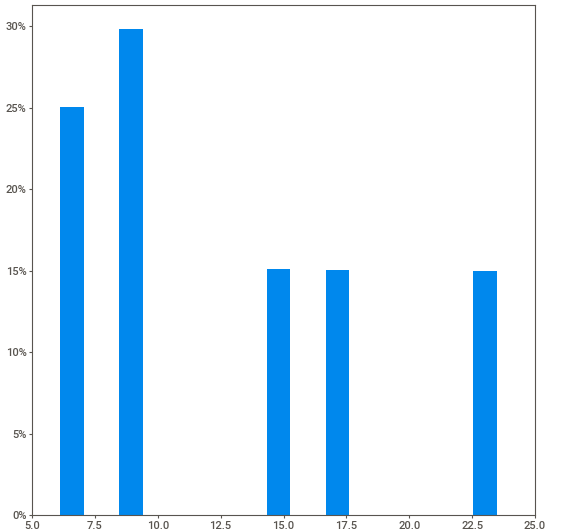
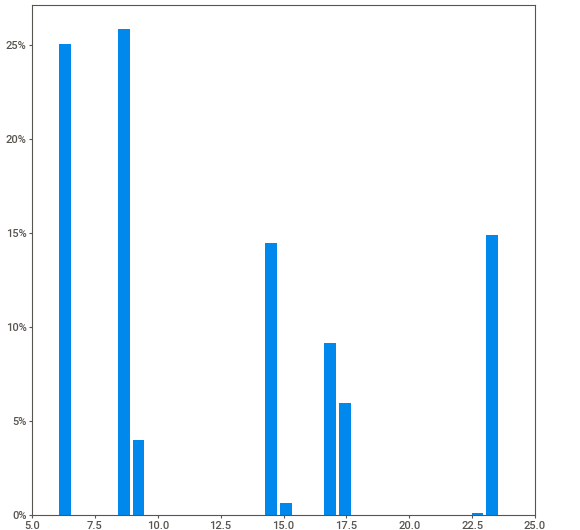
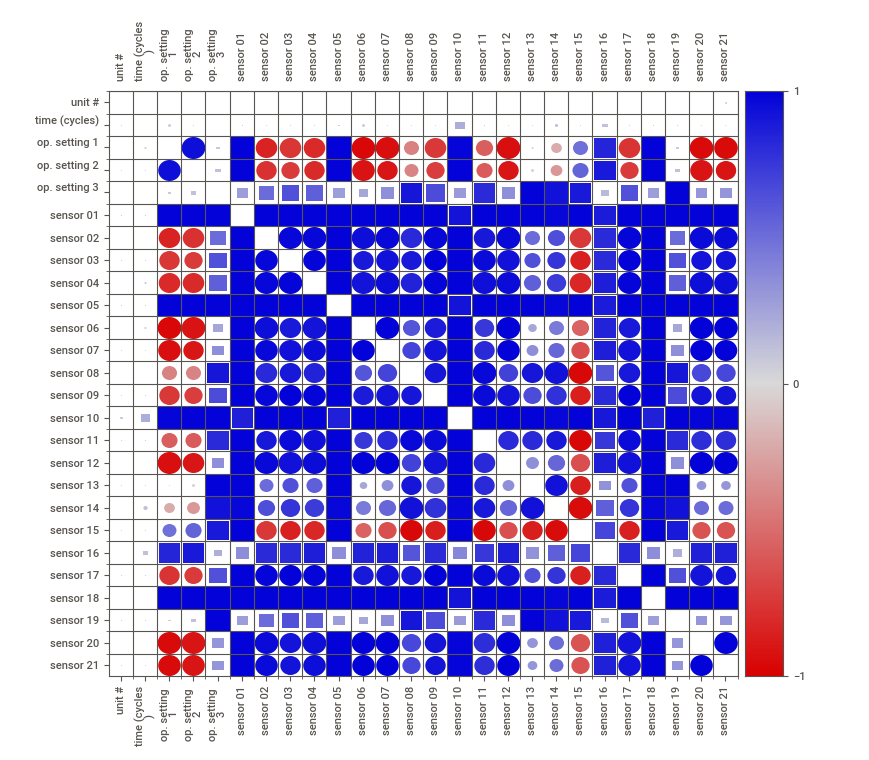
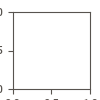

Report orig_data_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [42]:
orig_data_report = sv.analyze(train_data2)
orig_data_report.show_notebook()
orig_data_report.show_html('orig_data_report.html', open_browser=True)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated


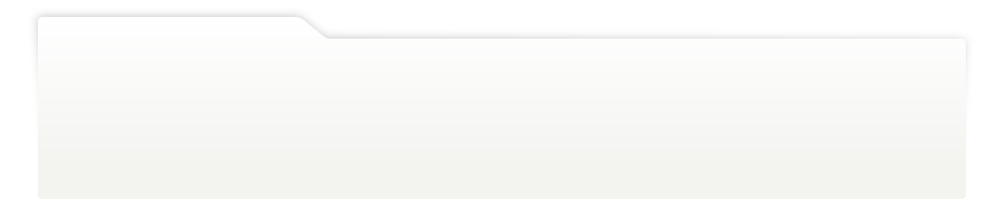
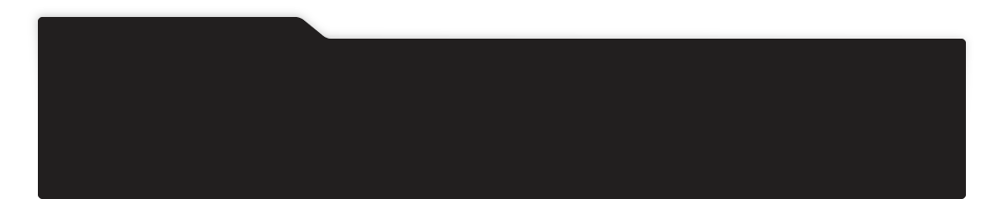
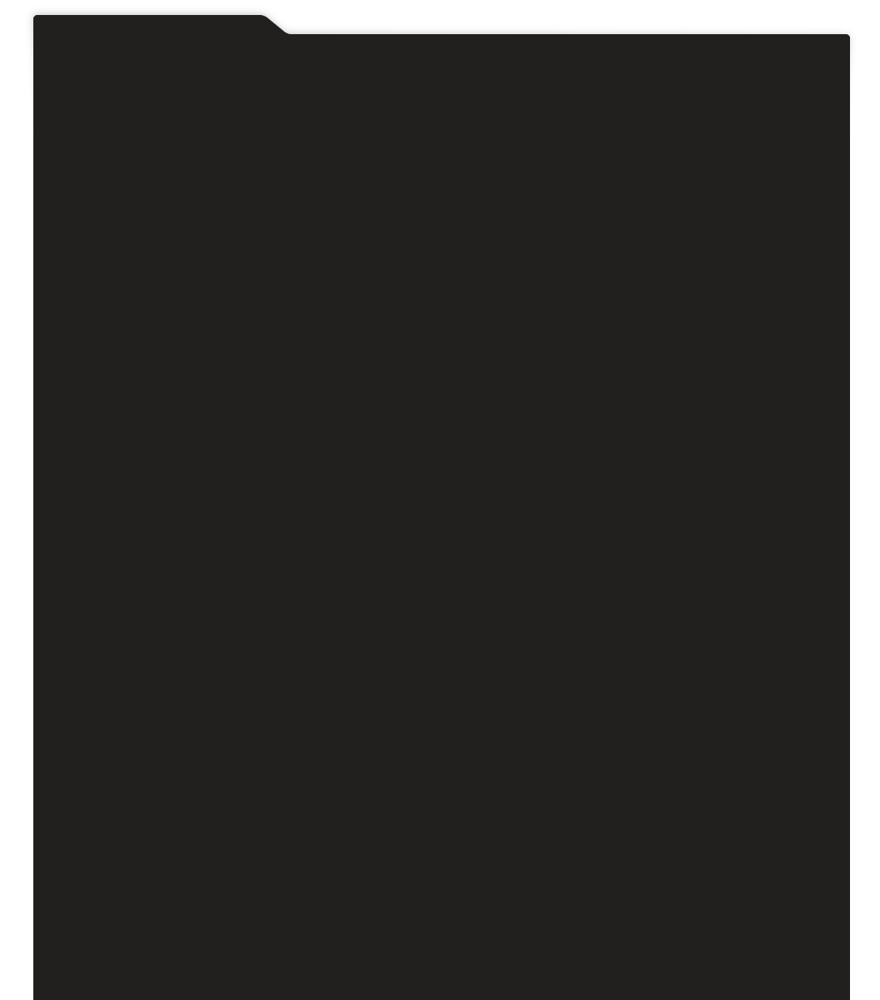
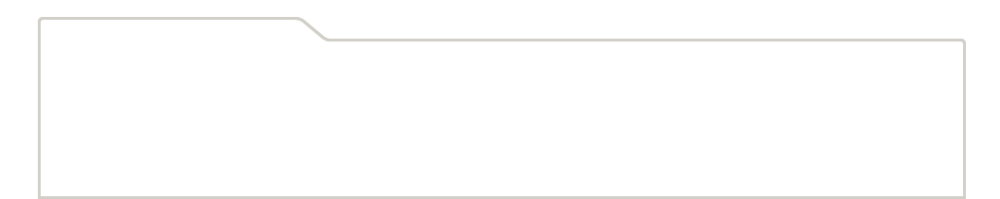
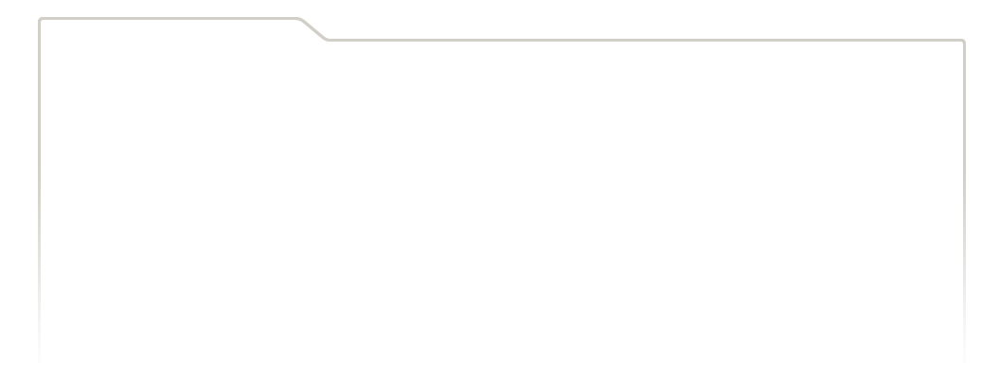
...
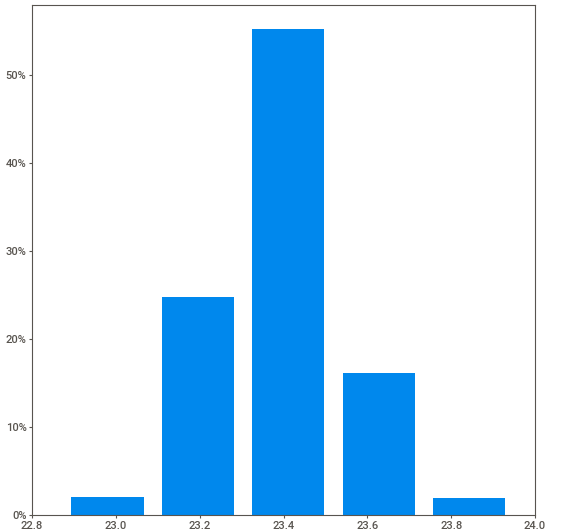
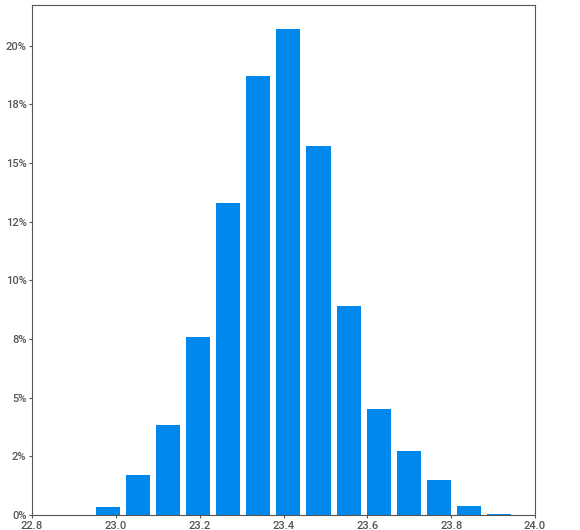
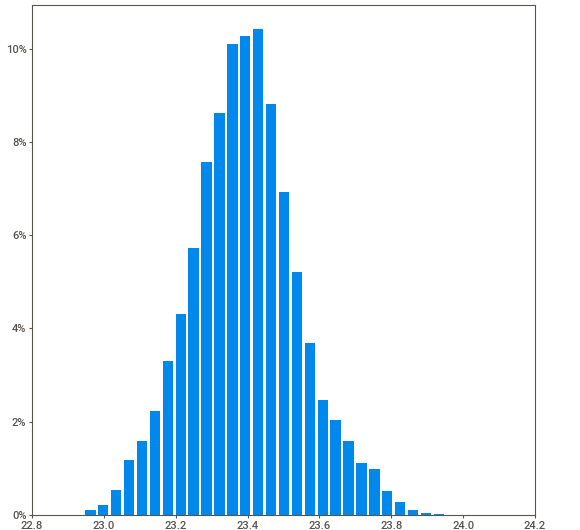
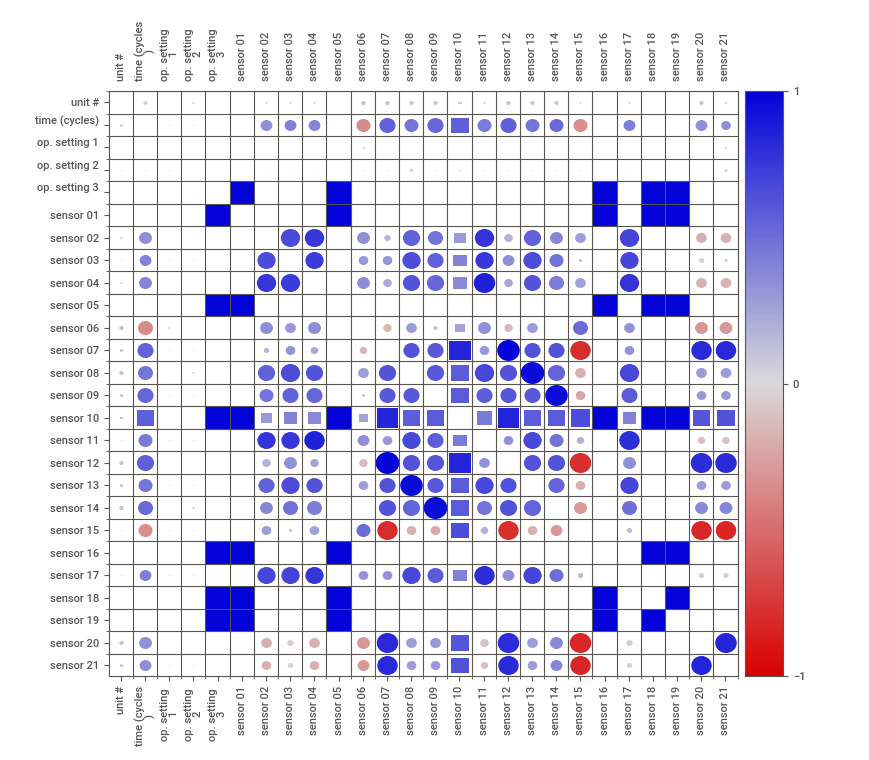
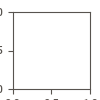

Report orig_data_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [43]:
orig_data_report = sv.analyze(train_data3)
orig_data_report.show_notebook()
orig_data_report.show_html('orig_data_report.html', open_browser=True)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/opt/miniconda3/envs/py39_12/lib/python3.9/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated


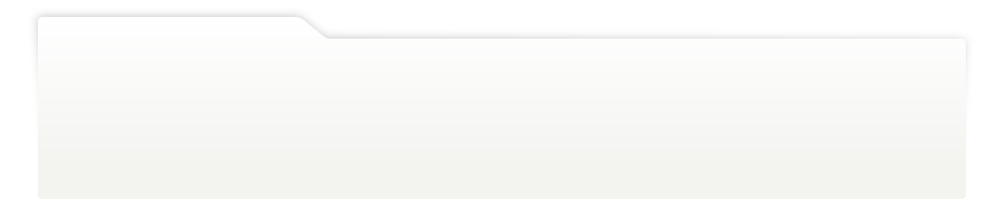
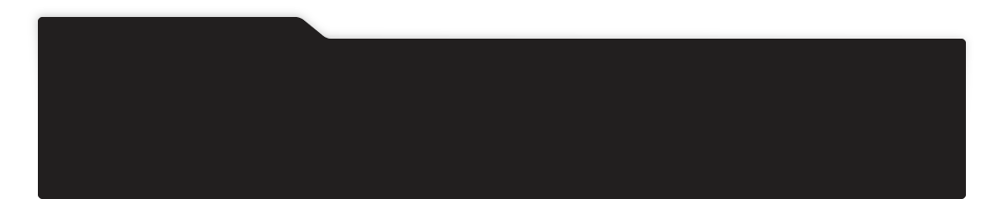
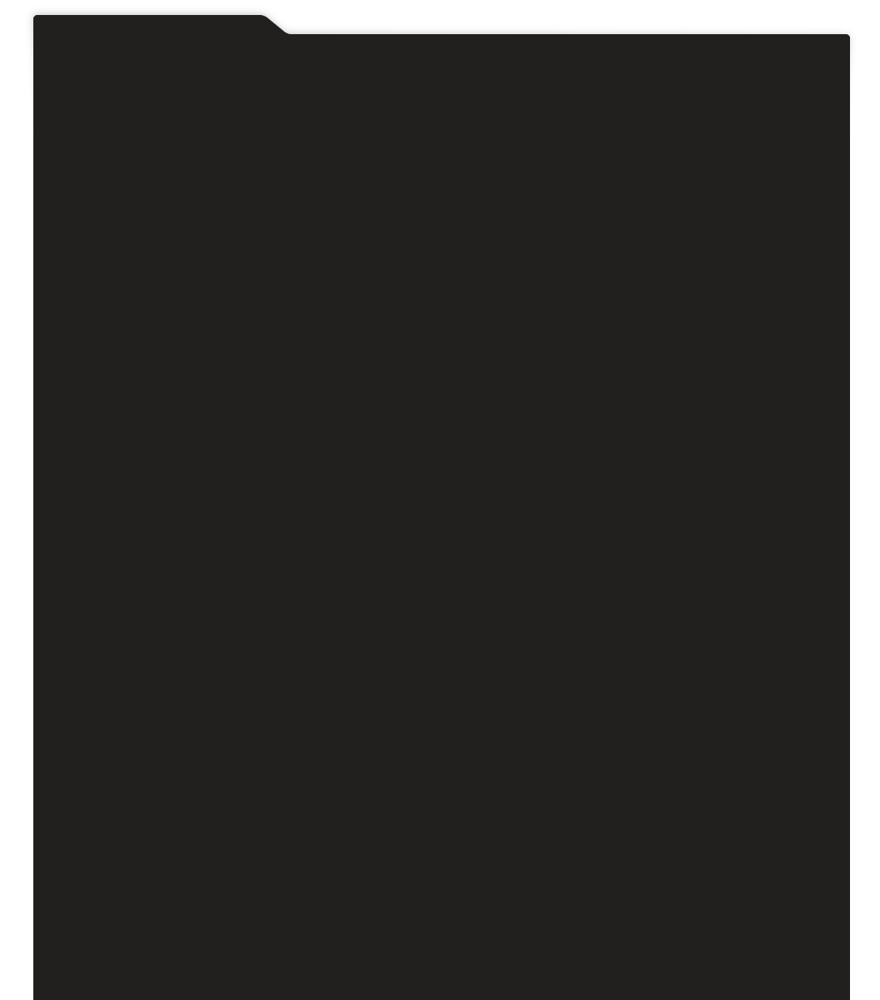
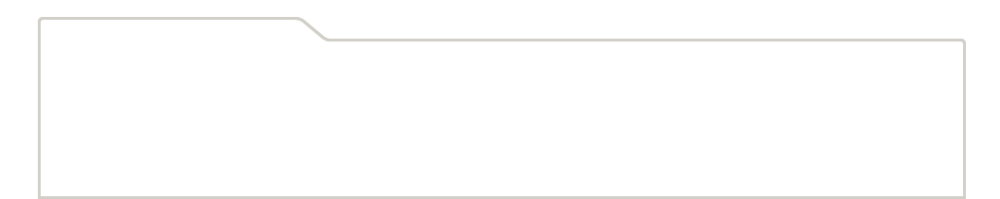
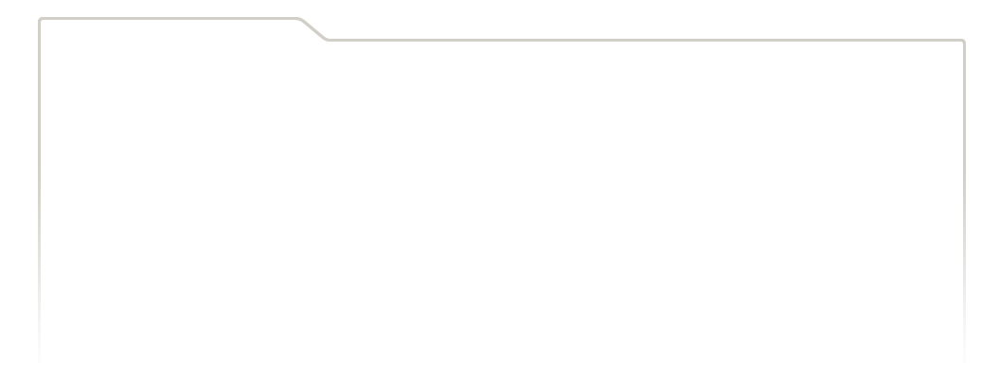
...
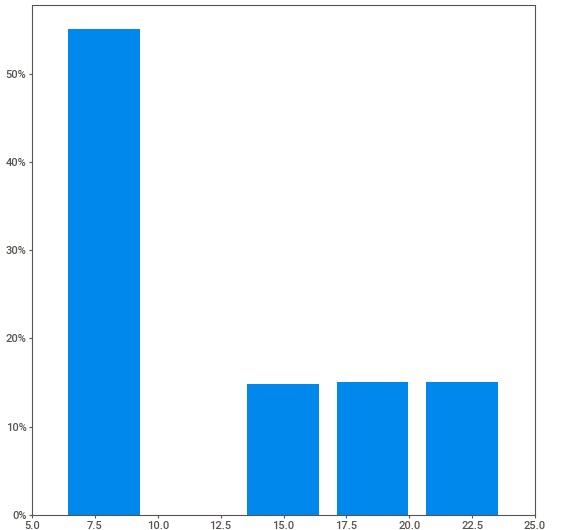
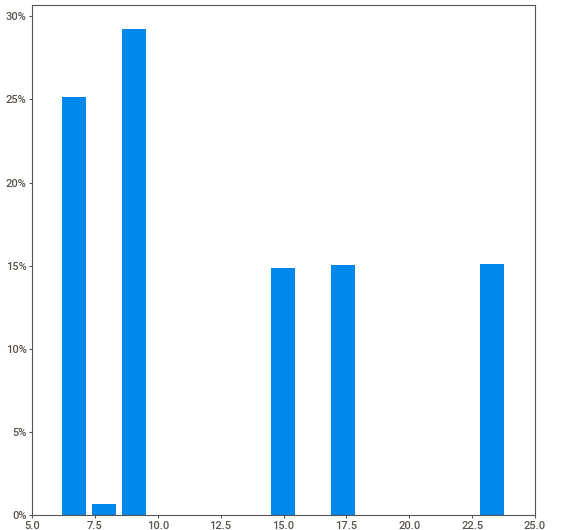
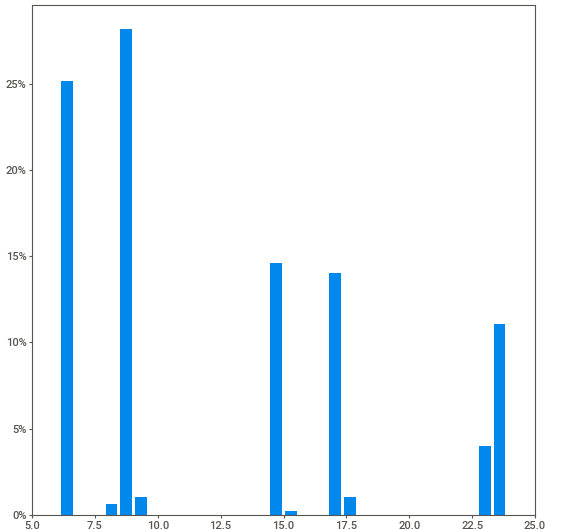
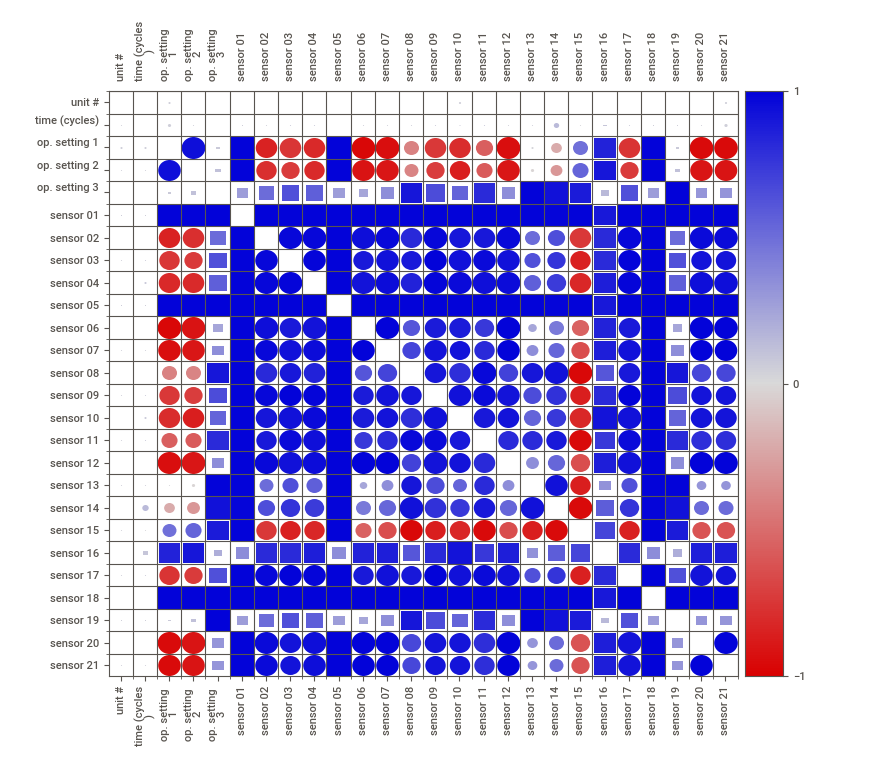
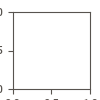

Report orig_data_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [44]:
orig_data_report = sv.analyze(train_data4)
orig_data_report.show_notebook()
orig_data_report.show_html('orig_data_report.html', open_browser=True)